In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 320), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  624.278 2.93518 0.300362


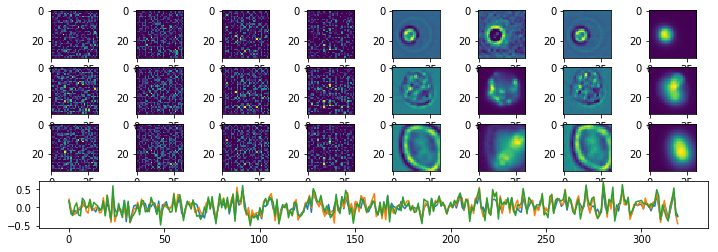

Epoch:  1 Iteration:  0 Loss:  18.4076 0.637892 0.000487536


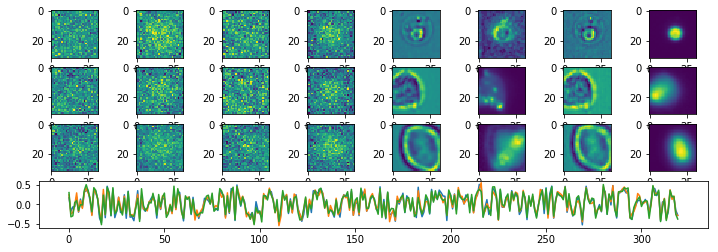

Epoch:  2 Iteration:  0 Loss:  15.2717 0.636211 0.00238156


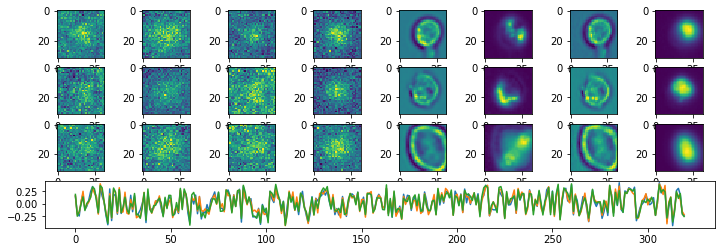

Epoch:  3 Iteration:  0 Loss:  13.3235 0.63517 0.00244933


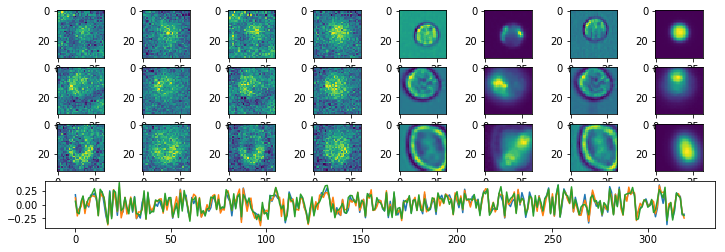

Epoch:  4 Iteration:  0 Loss:  13.6913 0.635317 0.000635296


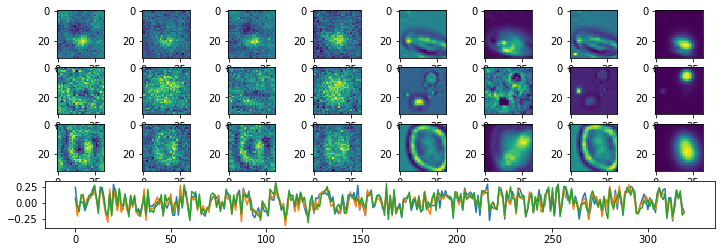

Epoch:  5 Iteration:  0 Loss:  10.7684 0.633847 0.00220135


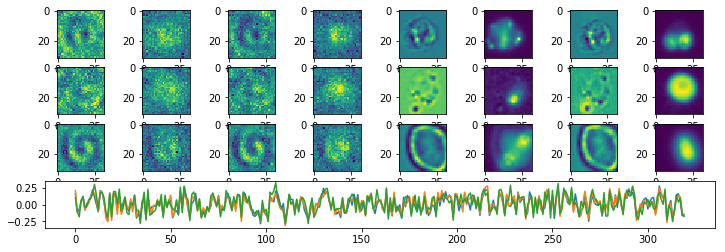

Epoch:  6 Iteration:  0 Loss:  9.37928 0.633092 0.000985414


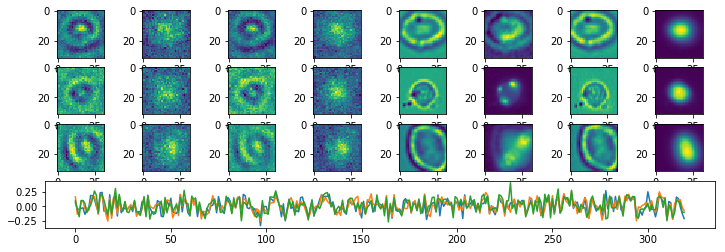

Epoch:  7 Iteration:  0 Loss:  8.86062 0.632825 0.00203425


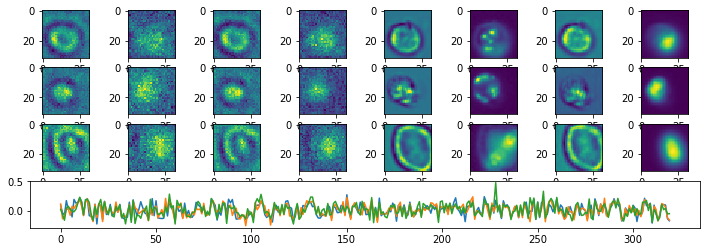

Epoch:  8 Iteration:  0 Loss:  8.00587 0.63237 0.00162169


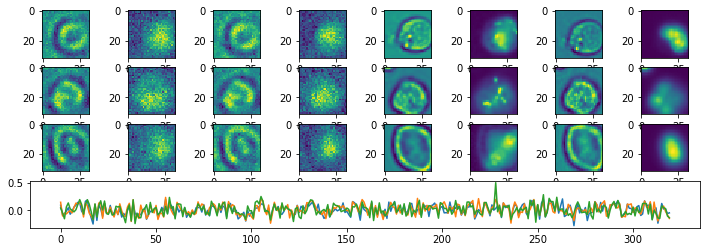

Epoch:  9 Iteration:  0 Loss:  7.43977 0.632073 0.00131971


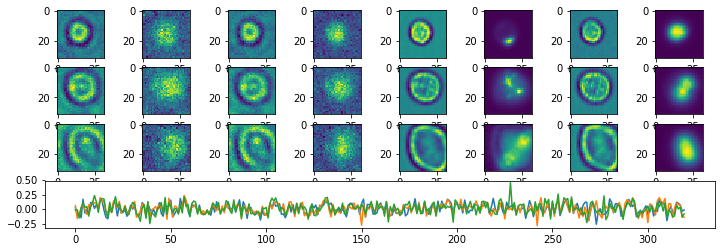

Epoch:  10 Iteration:  0 Loss:  7.02796 0.631855 0.00113621


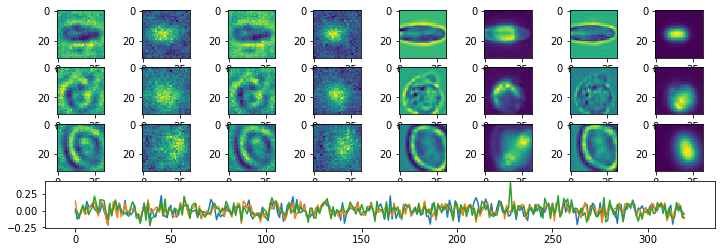

Epoch:  11 Iteration:  0 Loss:  6.72619 0.631697 0.000808984


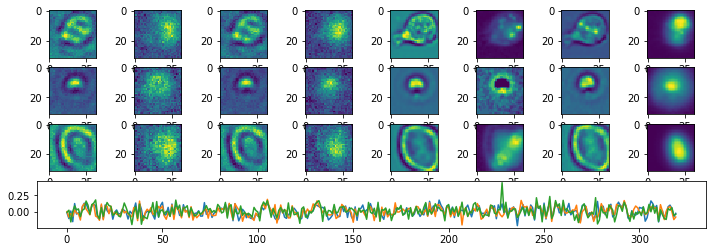

Epoch:  12 Iteration:  0 Loss:  6.40255 0.631528 0.000891298


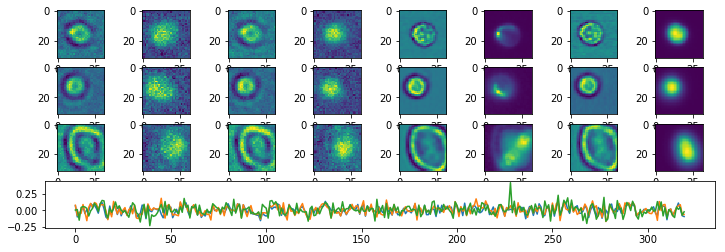

Epoch:  13 Iteration:  0 Loss:  6.14738 0.631394 0.00129876


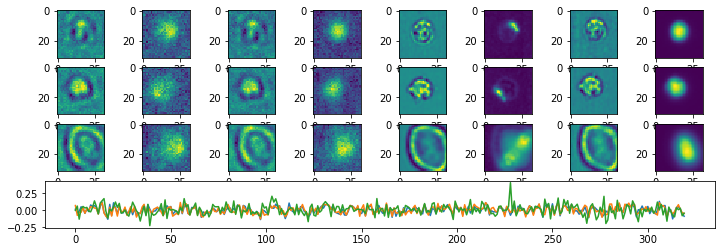

Epoch:  14 Iteration:  0 Loss:  5.95072 0.631291 0.001037


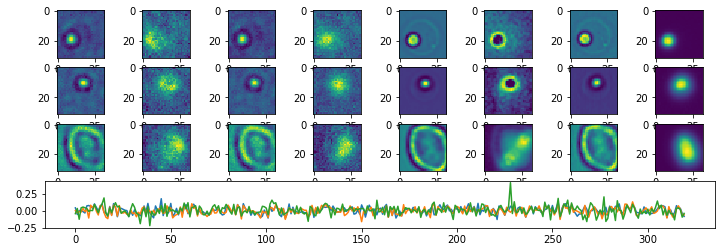

Epoch:  15 Iteration:  0 Loss:  5.86406 0.631244 0.00146765


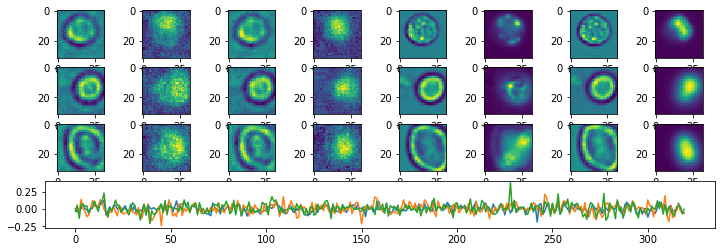

Epoch:  16 Iteration:  0 Loss:  5.61809 0.631118 0.00106519


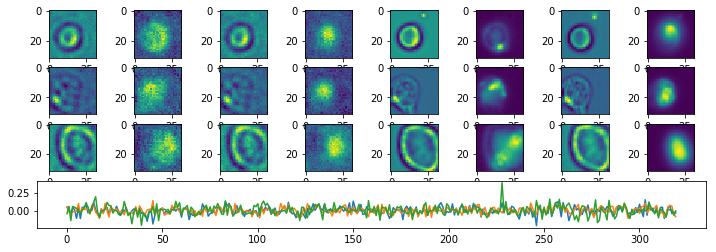

Epoch:  17 Iteration:  0 Loss:  5.38186 0.630991 0.00065133


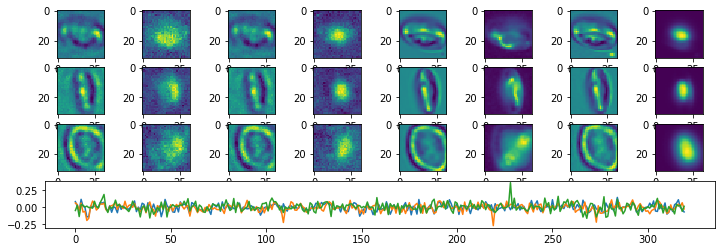

Epoch:  18 Iteration:  0 Loss:  5.1717 0.630877 0.000936419


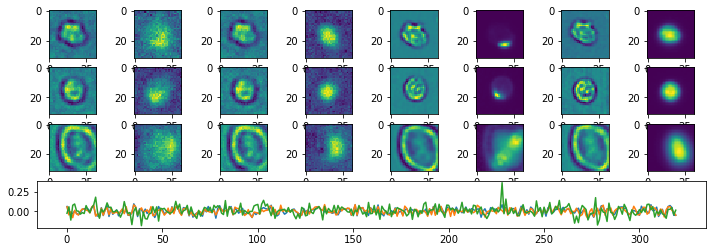

Epoch:  19 Iteration:  0 Loss:  4.98749 0.63078 0.00084424


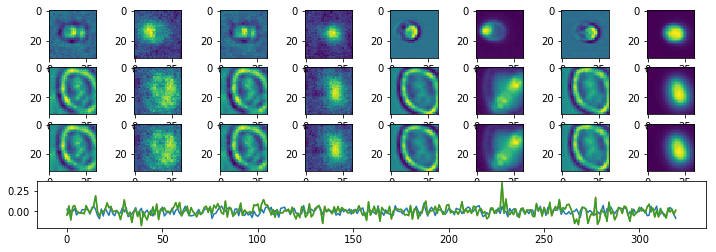

Epoch:  20 Iteration:  0 Loss:  4.83111 0.630695 0.000906855


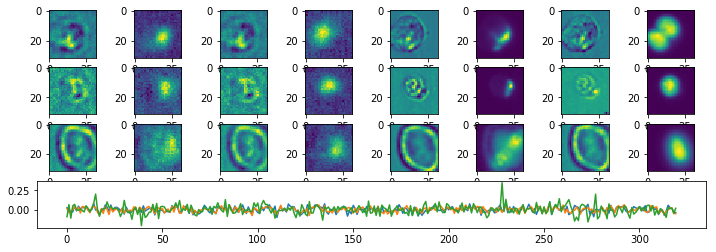

Epoch:  21 Iteration:  0 Loss:  4.6978 0.630625 0.000588179


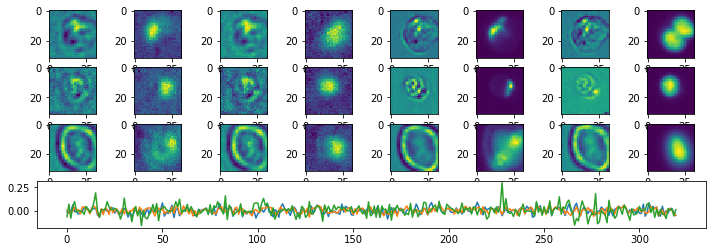

Epoch:  22 Iteration:  0 Loss:  4.56723 0.630556 0.000846207


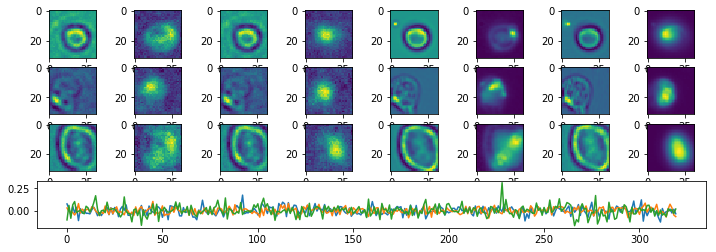

Epoch:  23 Iteration:  0 Loss:  4.48635 0.630513 0.000637114


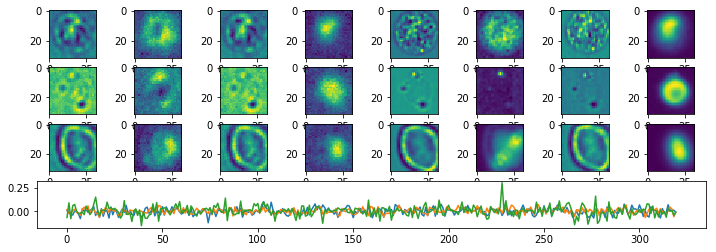

Epoch:  24 Iteration:  0 Loss:  4.46181 0.630503 0.000679791


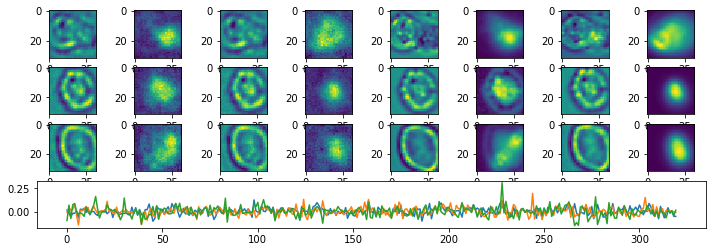

Epoch:  25 Iteration:  0 Loss:  4.28146 0.630406 0.000568867


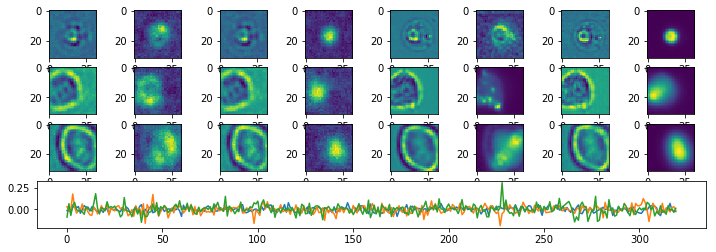

Epoch:  26 Iteration:  0 Loss:  4.20694 0.630367 0.000908464


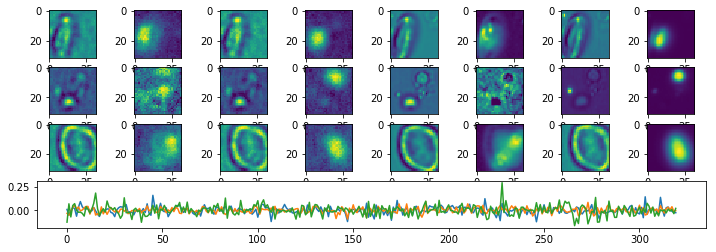

Epoch:  27 Iteration:  0 Loss:  4.13852 0.630329 0.000683188


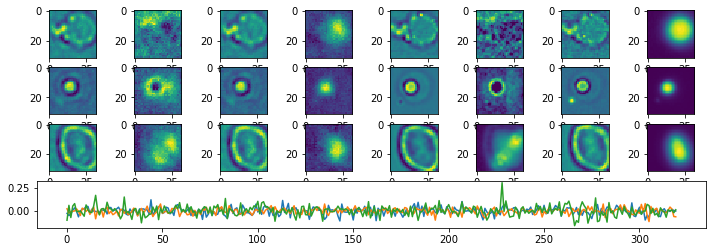

Epoch:  28 Iteration:  0 Loss:  4.04805 0.630283 0.000616401


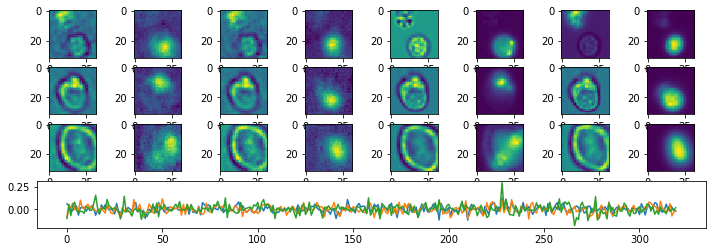

Epoch:  29 Iteration:  0 Loss:  4.00746 0.630258 9.50992e-05


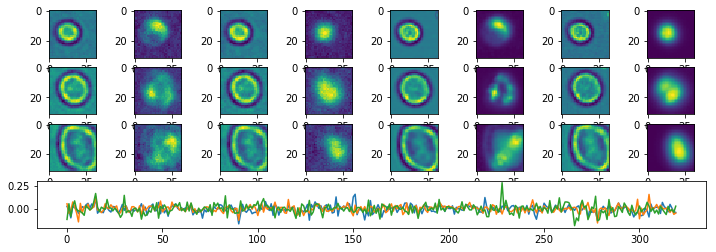

Epoch:  30 Iteration:  0 Loss:  3.92142 0.630214 0.00040254


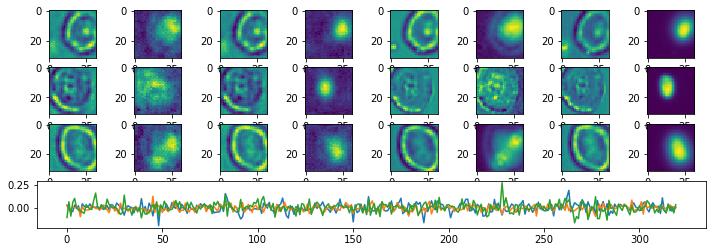

Epoch:  31 Iteration:  0 Loss:  3.85535 0.63018 0.000418335


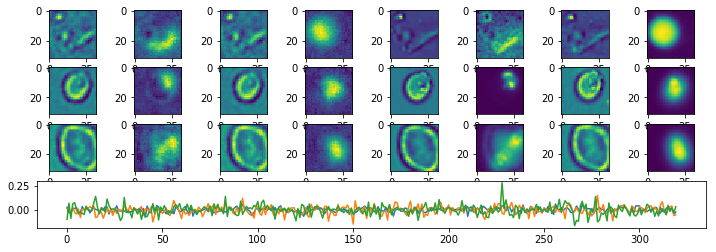

Epoch:  32 Iteration:  0 Loss:  3.8051 0.630153 0.000774086


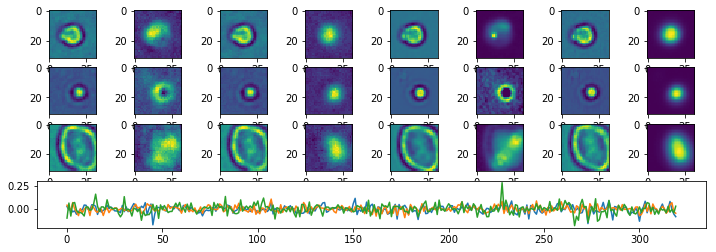

Epoch:  33 Iteration:  0 Loss:  3.75332 0.630127 0.00087285


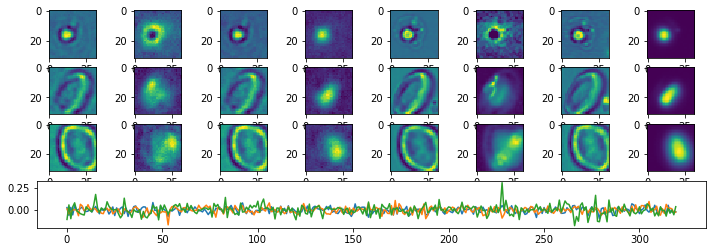

Epoch:  34 Iteration:  0 Loss:  3.77905 0.630141 0.00111401


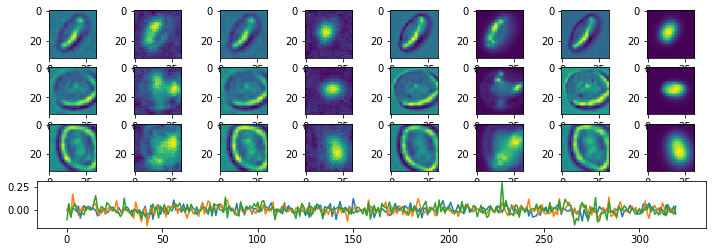

Epoch:  35 Iteration:  0 Loss:  3.62007 0.630057 0.000506014


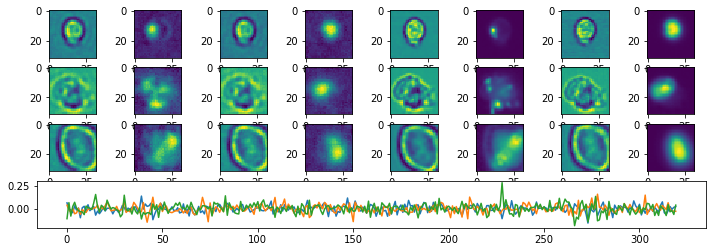

Epoch:  36 Iteration:  0 Loss:  3.6403 0.630066 0.000993639


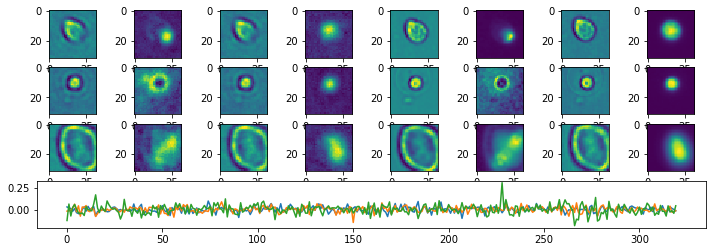

Epoch:  37 Iteration:  0 Loss:  3.5546 0.630021 0.000275701


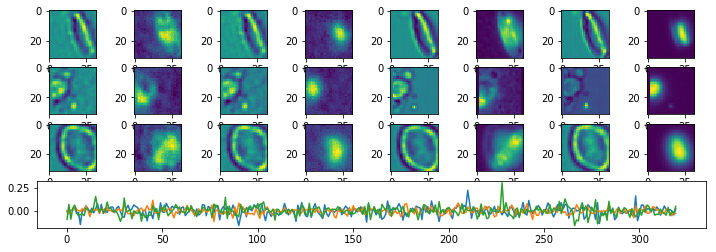

Epoch:  38 Iteration:  0 Loss:  3.48037 0.629983 0.000586212


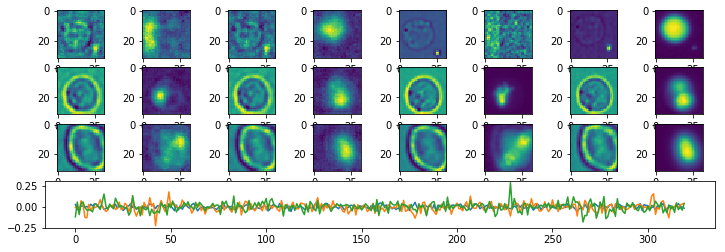

Epoch:  39 Iteration:  0 Loss:  3.4668 0.629976 0.000229746


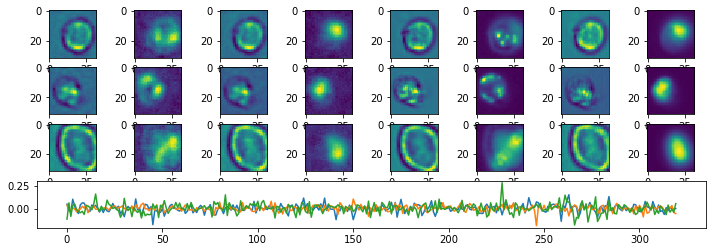

Epoch:  40 Iteration:  0 Loss:  3.38711 0.629934 0.000575453


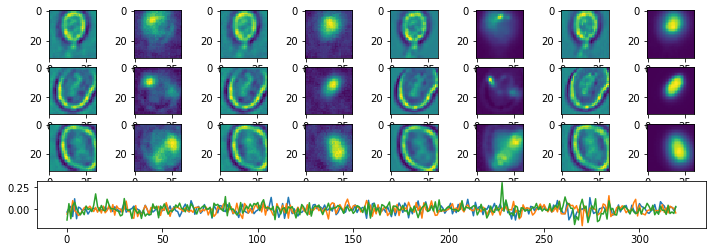

Epoch:  41 Iteration:  0 Loss:  3.31701 0.629898 0.000427961


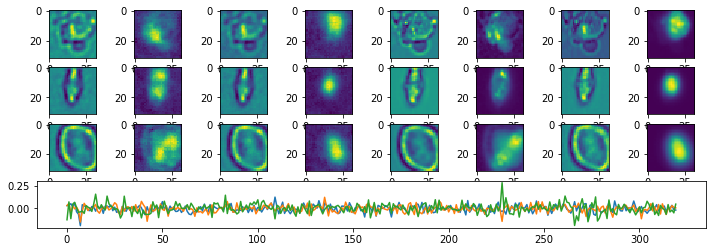

Epoch:  42 Iteration:  0 Loss:  3.2804 0.629881 0.000337422


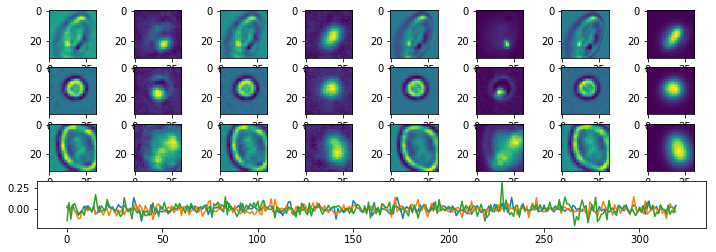

Epoch:  43 Iteration:  0 Loss:  3.23638 0.629856 0.000243187


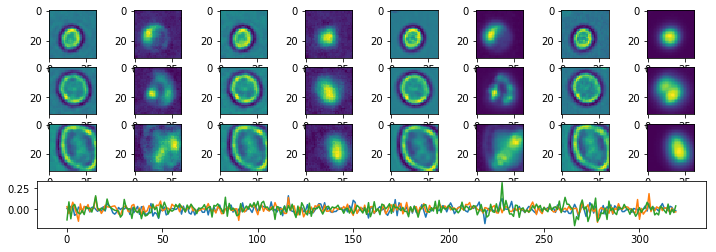

Epoch:  44 Iteration:  0 Loss:  3.23032 0.629855 0.000101298


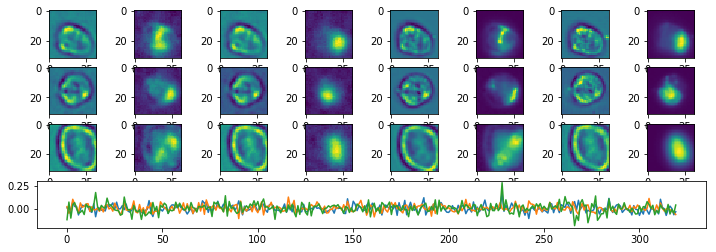

Epoch:  45 Iteration:  0 Loss:  3.16937 0.629822 0.000500917


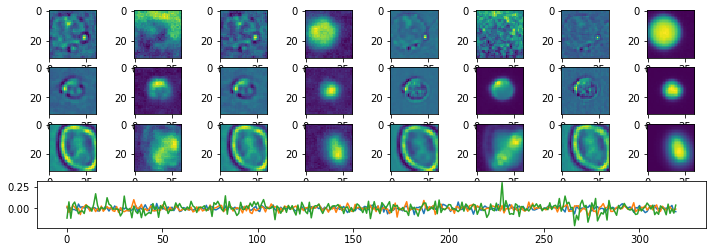

Epoch:  46 Iteration:  0 Loss:  3.12574 0.629801 6.14822e-05


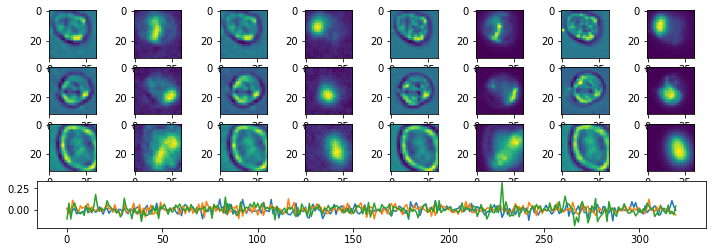

Epoch:  47 Iteration:  0 Loss:  3.10674 0.629792 6.85751e-05


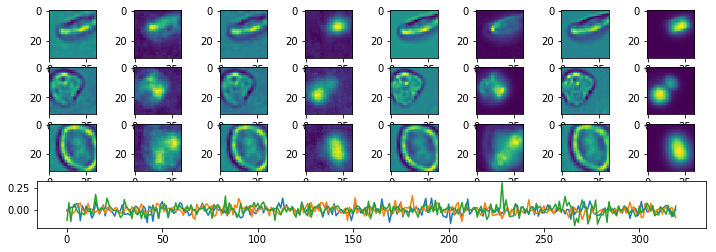

Epoch:  48 Iteration:  0 Loss:  3.04456 0.629757 0.000676781


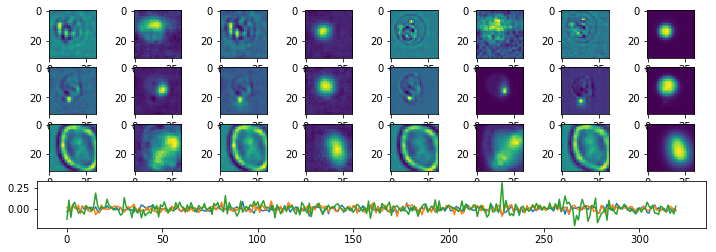

Epoch:  49 Iteration:  0 Loss:  3.02939 0.62975 0.000197262


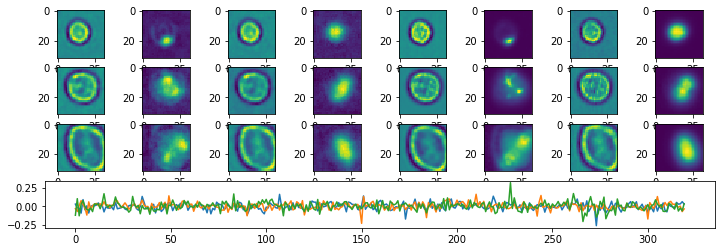

Epoch:  50 Iteration:  0 Loss:  2.97391 0.629721 0.000445127


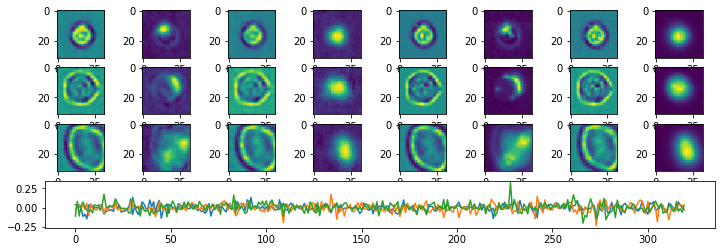

Epoch:  51 Iteration:  0 Loss:  2.93768 0.629703 0.000244766


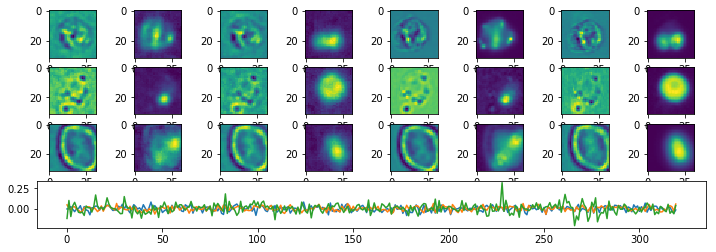

Epoch:  52 Iteration:  0 Loss:  2.90662 0.629687 0.000377685


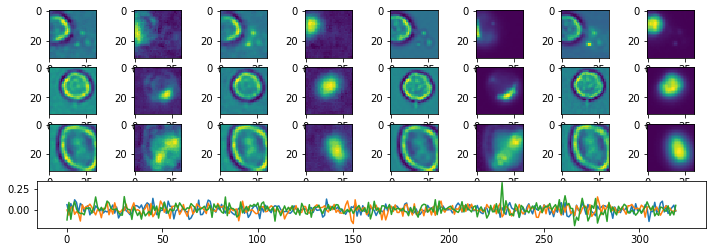

Epoch:  53 Iteration:  0 Loss:  2.8797 0.629674 0.000208884


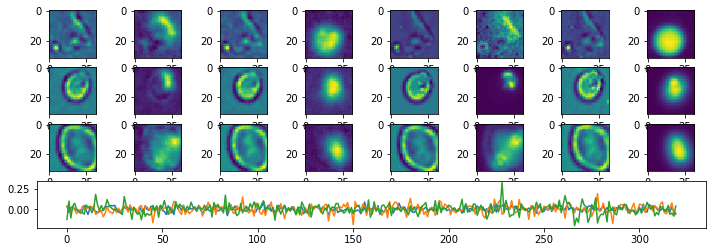

Epoch:  54 Iteration:  0 Loss:  2.84364 0.629655 0.000805855


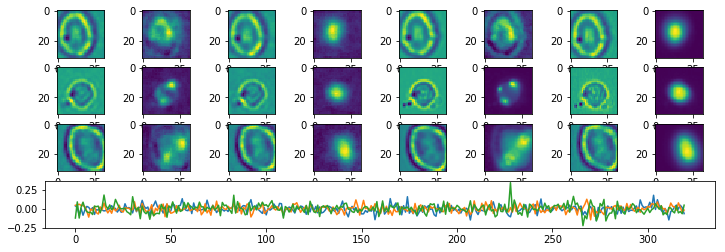

Epoch:  55 Iteration:  0 Loss:  2.82298 0.629645 0.000247121


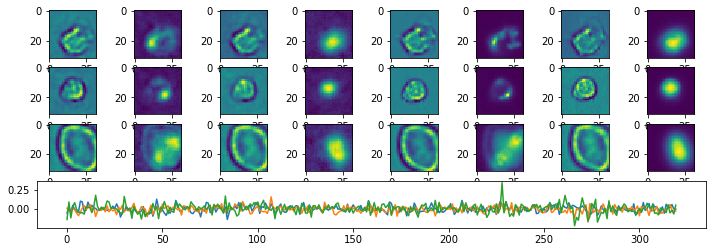

Epoch:  56 Iteration:  0 Loss:  2.78202 0.629624 0.00064528


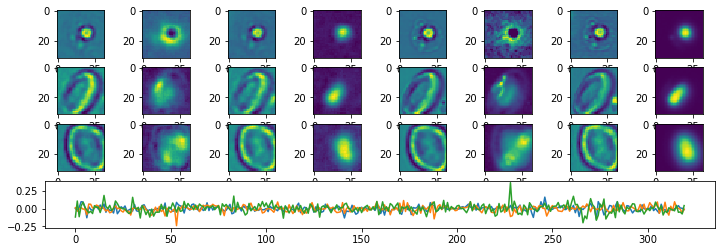

Epoch:  57 Iteration:  0 Loss:  2.73025 0.629596 0.00045377


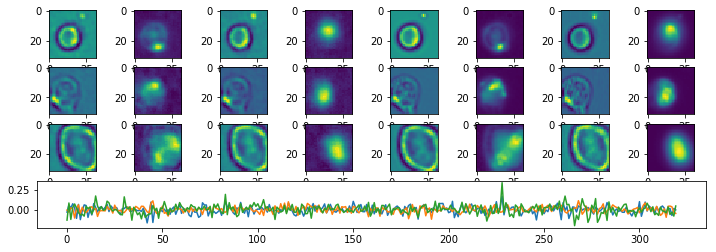

Epoch:  58 Iteration:  0 Loss:  2.7572 0.629617 0.000577986


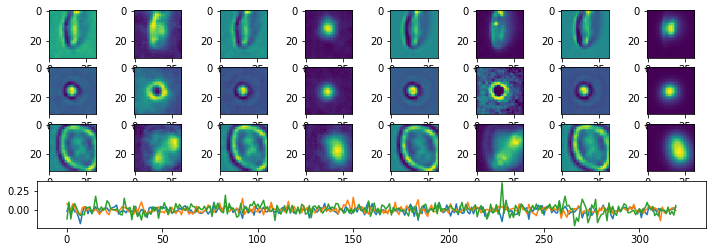

Epoch:  59 Iteration:  0 Loss:  2.70257 0.629583 0.000648052


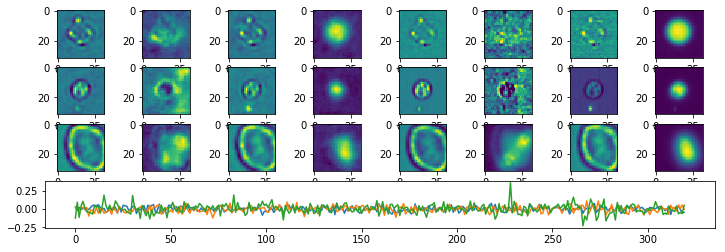

Epoch:  60 Iteration:  0 Loss:  2.65281 0.629557 0.000316769


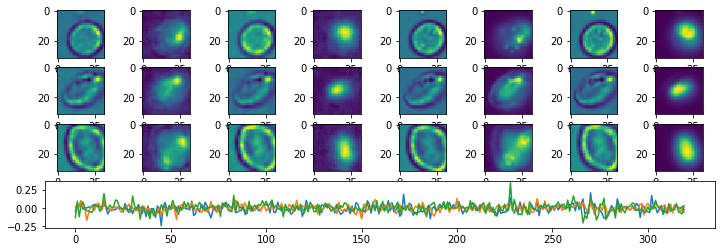

Epoch:  61 Iteration:  0 Loss:  2.64127 0.629552 0.000319719


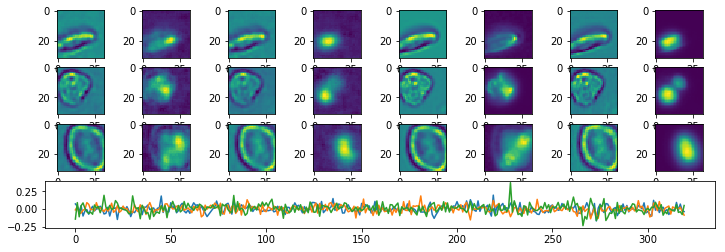

Epoch:  62 Iteration:  0 Loss:  2.62374 0.629545 0.00018847


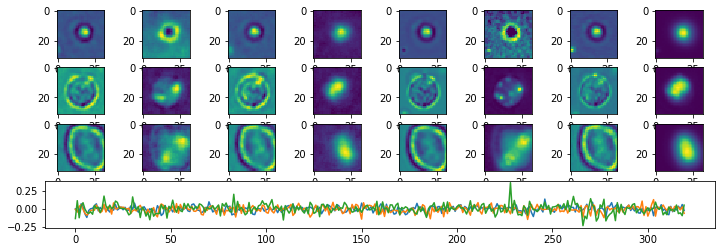

Epoch:  63 Iteration:  0 Loss:  2.5802 0.629521 0.000496179


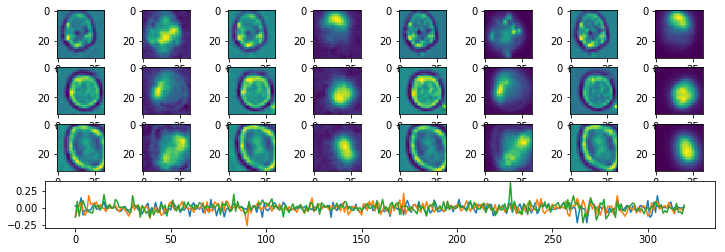

Epoch:  64 Iteration:  0 Loss:  2.57199 0.629518 0.000363708


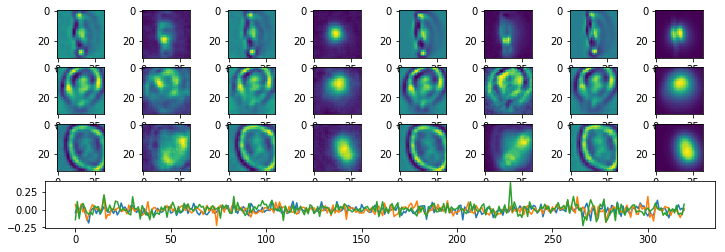

Epoch:  65 Iteration:  0 Loss:  2.54306 0.629501 0.000475168


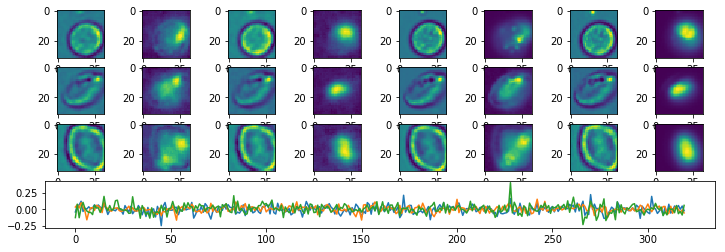

Epoch:  66 Iteration:  0 Loss:  2.51044 0.629484 0.000370055


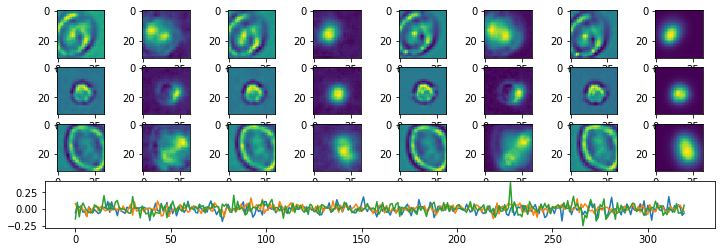

Epoch:  67 Iteration:  0 Loss:  2.49979 0.629483 0.000302017


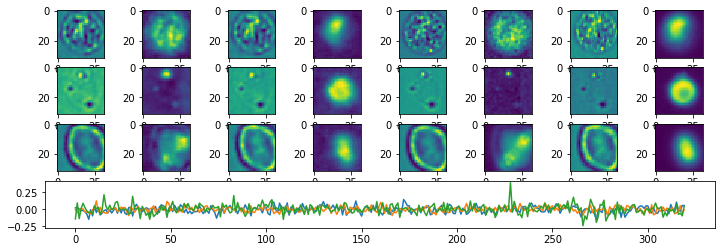

Epoch:  68 Iteration:  0 Loss:  2.4972 0.629477 0.000178397


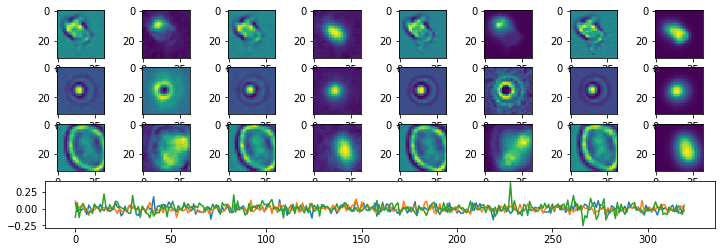

Epoch:  69 Iteration:  0 Loss:  2.7775 0.629629 0.000391036


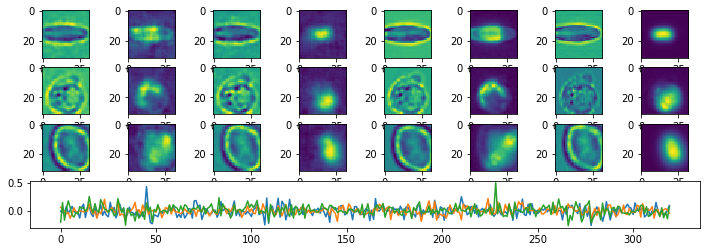

Epoch:  70 Iteration:  0 Loss:  2.61208 0.629538 0.000374734


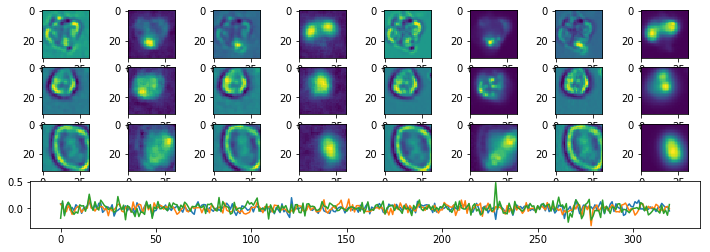

Epoch:  71 Iteration:  0 Loss:  2.57117 0.62952 0.000355095


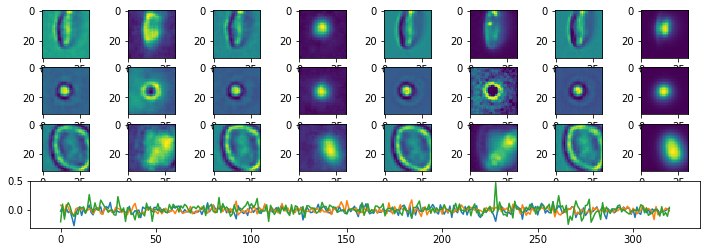

Epoch:  72 Iteration:  0 Loss:  2.55103 0.629511 0.000381052


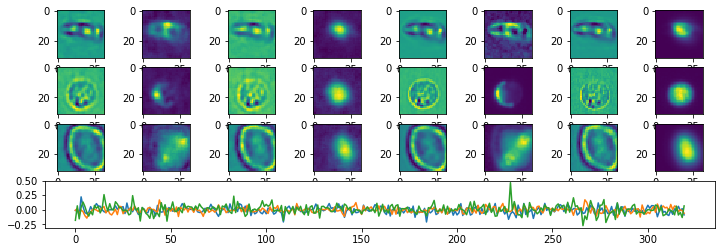

Epoch:  73 Iteration:  0 Loss:  2.52109 0.629493 0.000387043


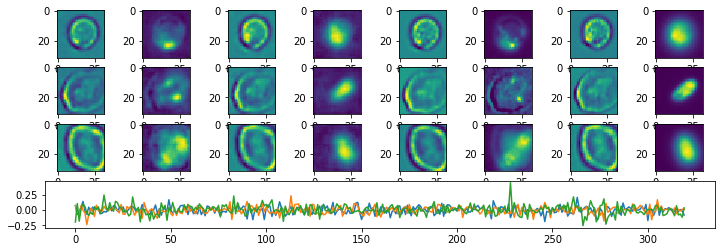

Epoch:  74 Iteration:  0 Loss:  2.49051 0.629474 0.000340998


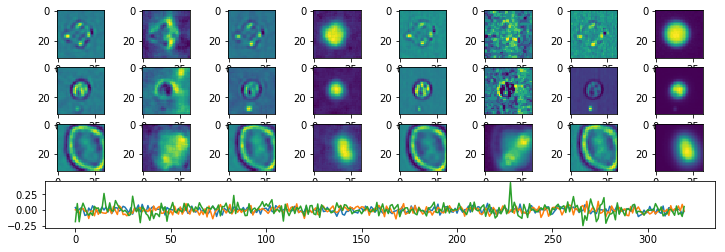

Epoch:  75 Iteration:  0 Loss:  2.48544 0.629471 0.000342071


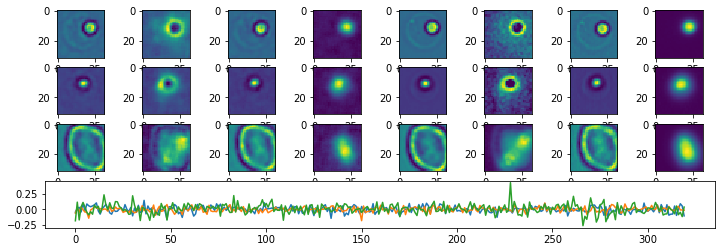

Epoch:  76 Iteration:  0 Loss:  2.4601 0.629457 0.000343829


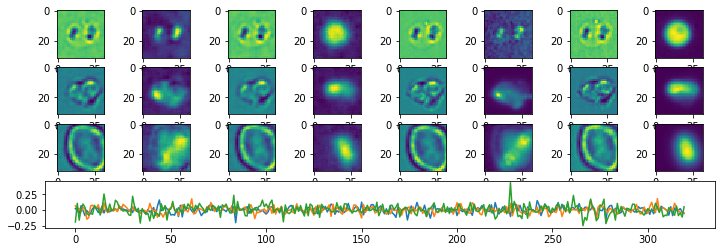

Epoch:  77 Iteration:  0 Loss:  2.48599 0.629473 0.000299633


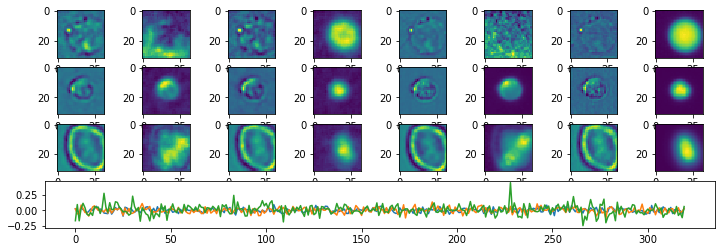

Epoch:  78 Iteration:  0 Loss:  2.44369 0.629449 0.00032863


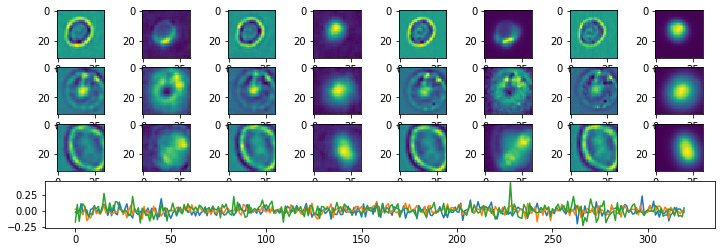

Epoch:  79 Iteration:  0 Loss:  2.44567 0.629452 0.000354558


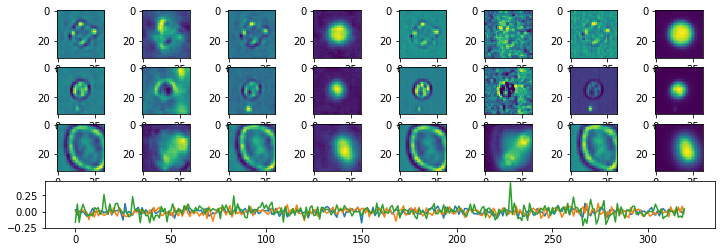

Epoch:  80 Iteration:  0 Loss:  2.44888 0.629456 0.000497282


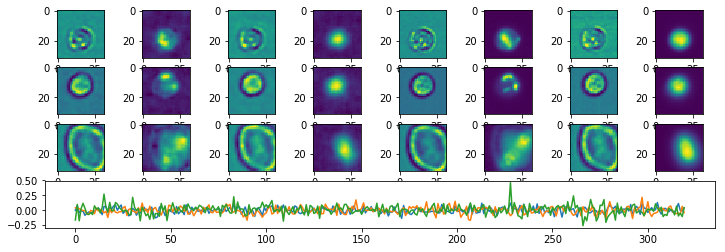

Epoch:  81 Iteration:  0 Loss:  2.4163 0.629435 0.000446141


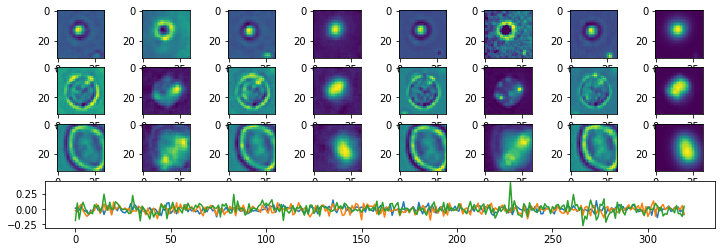

Epoch:  82 Iteration:  0 Loss:  2.41003 0.629432 0.000191569


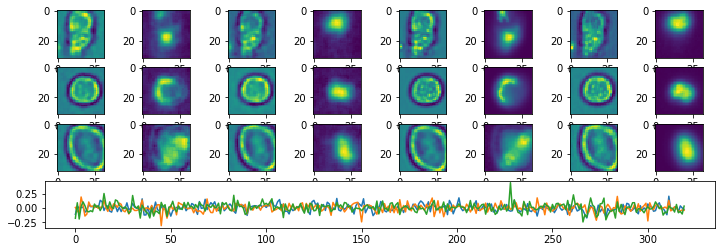

Epoch:  83 Iteration:  0 Loss:  2.39518 0.629423 0.000220567


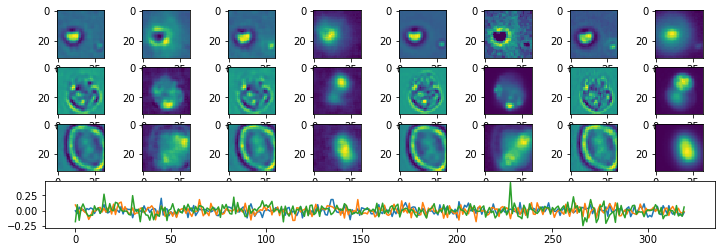

Epoch:  84 Iteration:  0 Loss:  2.41827 0.629435 5.31971e-05


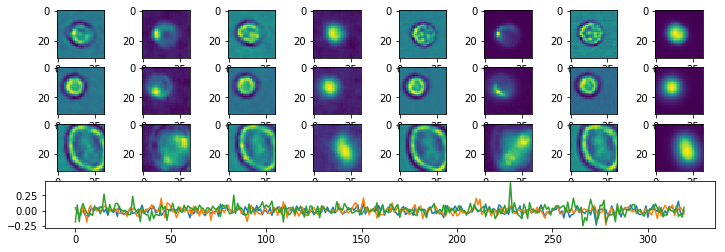

Epoch:  85 Iteration:  0 Loss:  2.38277 0.629417 0.000596493


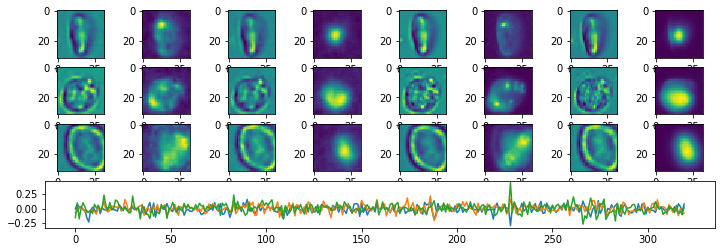

Epoch:  86 Iteration:  0 Loss:  2.37162 0.629412 0.000363052


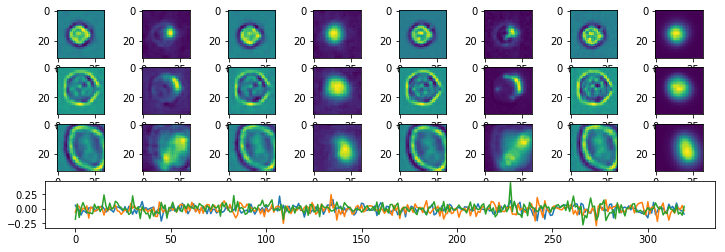

Epoch:  87 Iteration:  0 Loss:  2.39745 0.629427 0.00045827


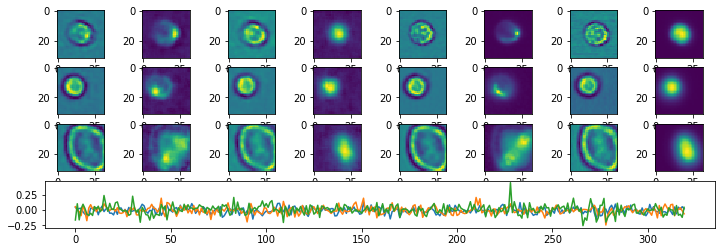

Epoch:  88 Iteration:  0 Loss:  2.39659 0.629424 0.000250369


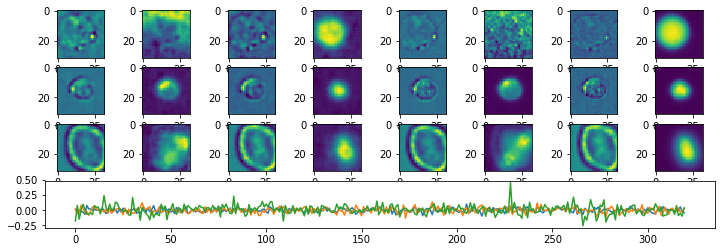

Epoch:  89 Iteration:  0 Loss:  2.3738 0.629413 0.00035581


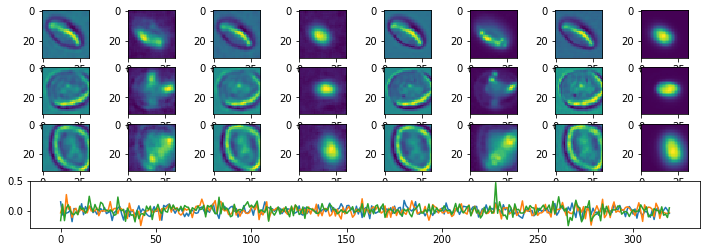

Epoch:  90 Iteration:  0 Loss:  2.35783 0.629405 0.00049755


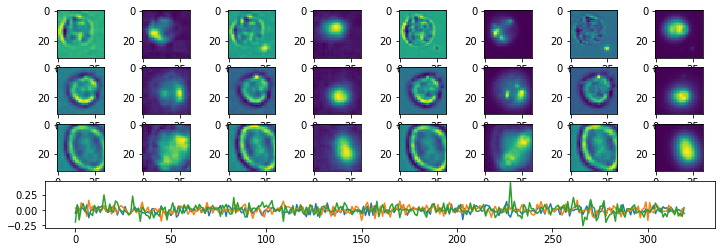

Epoch:  91 Iteration:  0 Loss:  2.34101 0.6294 0.000437617


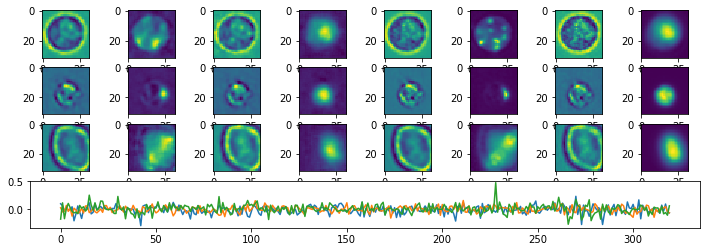

Epoch:  92 Iteration:  0 Loss:  2.342 0.629397 0.000551432


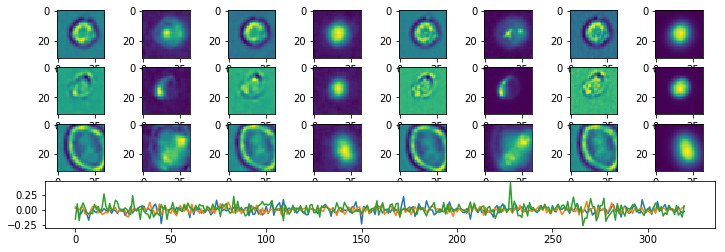

Epoch:  93 Iteration:  0 Loss:  2.30694 0.629378 0.000319362


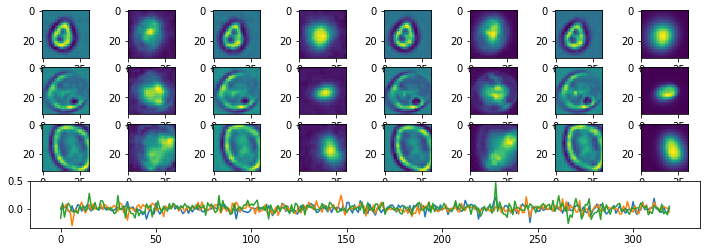

Epoch:  94 Iteration:  0 Loss:  2.32712 0.629388 0.000289798


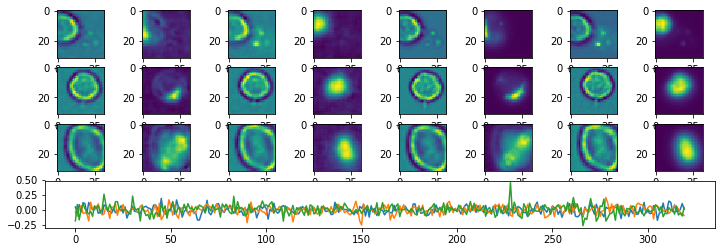

Epoch:  95 Iteration:  0 Loss:  2.31829 0.629385 0.000106156


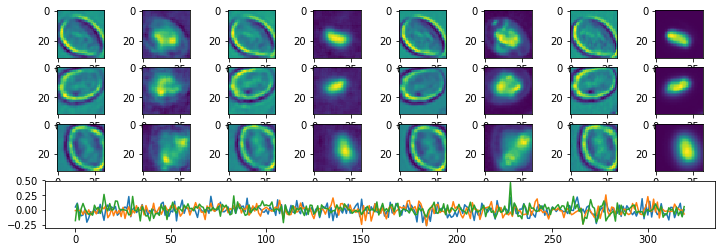

Epoch:  96 Iteration:  0 Loss:  2.31429 0.629382 0.000180811


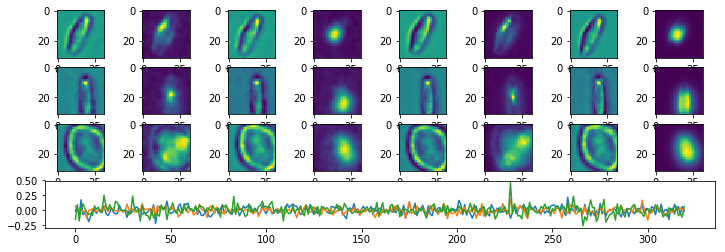

Epoch:  97 Iteration:  0 Loss:  2.3263 0.62939 0.000454038


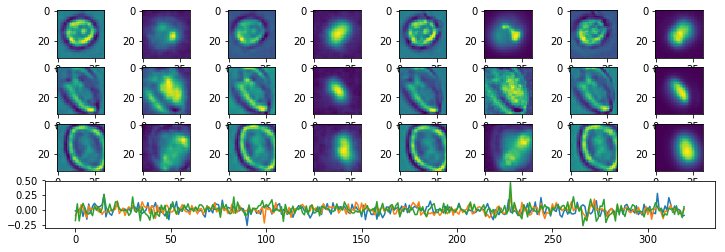

Epoch:  98 Iteration:  0 Loss:  2.2823 0.629366 0.000371456


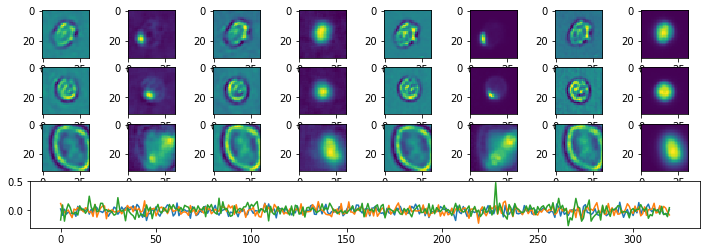

Epoch:  99 Iteration:  0 Loss:  2.26538 0.629357 0.000413626


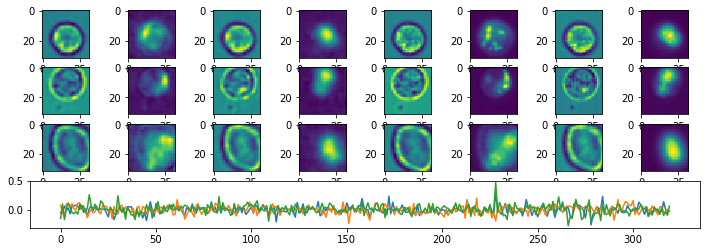

Epoch:  100 Iteration:  0 Loss:  2.27685 0.629363 0.000173271


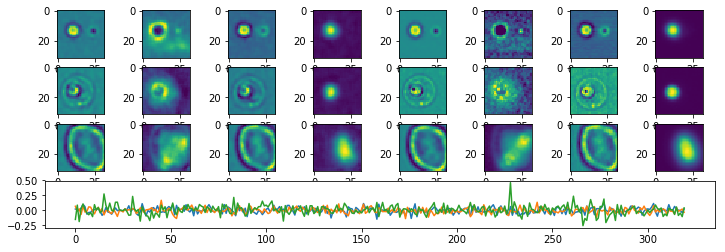

Epoch:  101 Iteration:  0 Loss:  2.2479 0.62935 0.00021264


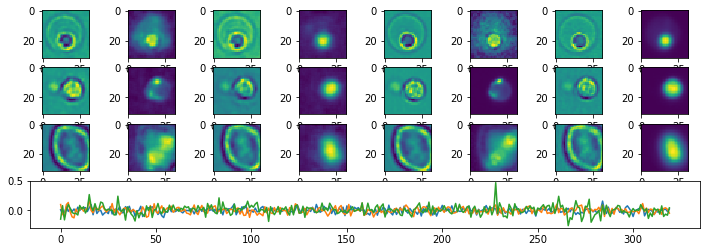

Epoch:  102 Iteration:  0 Loss:  2.96164 0.629723 0.000453025


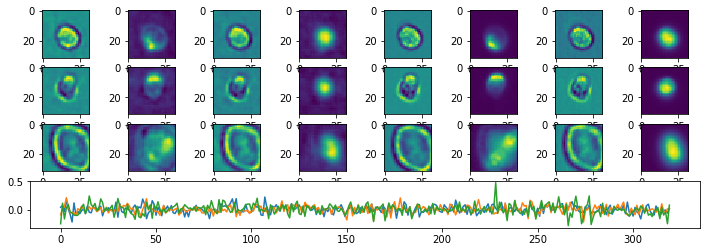

Epoch:  103 Iteration:  0 Loss:  2.68277 0.629577 0.000236034


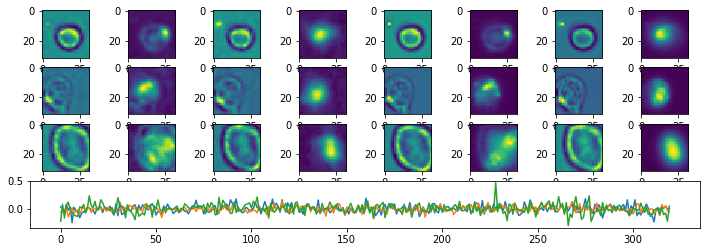

Epoch:  104 Iteration:  0 Loss:  2.56853 0.629517 0.000218838


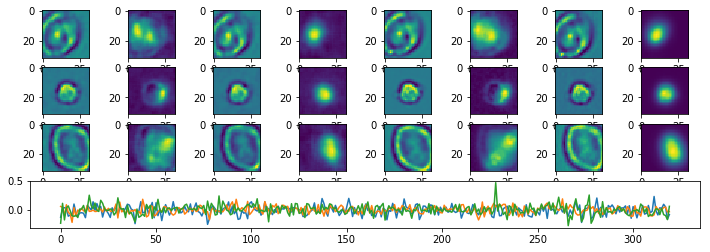

Epoch:  105 Iteration:  0 Loss:  2.50043 0.629483 0.000196368


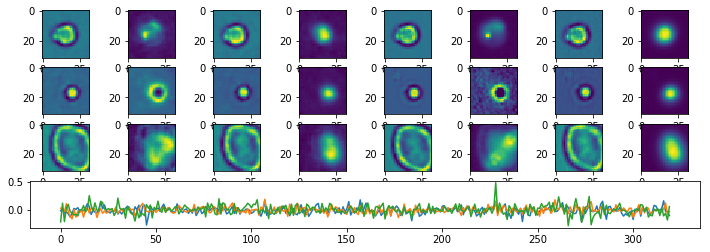

Epoch:  106 Iteration:  0 Loss:  2.44934 0.629454 0.000198126


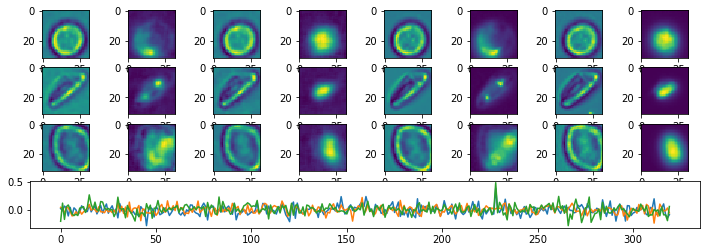

Epoch:  107 Iteration:  0 Loss:  2.4056 0.629431 0.000184178


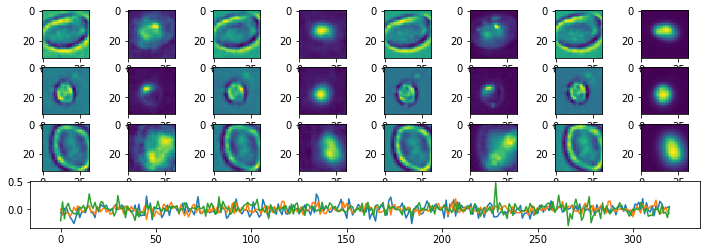

Epoch:  108 Iteration:  0 Loss:  2.39962 0.62943 0.000239044


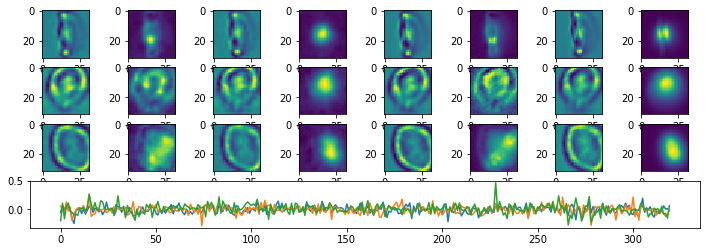

Epoch:  109 Iteration:  0 Loss:  2.35171 0.629406 0.000206143


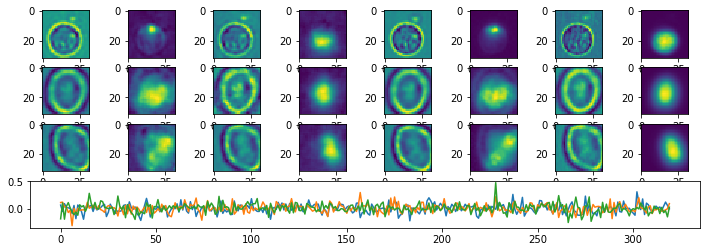

Epoch:  110 Iteration:  0 Loss:  2.33447 0.629393 0.000244975


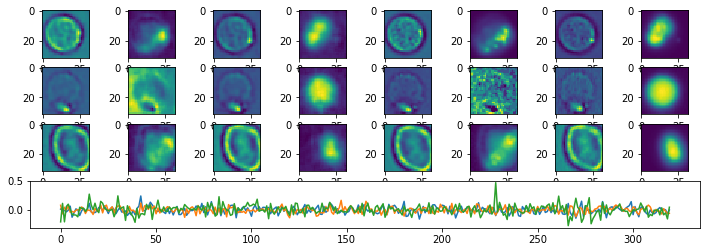

Epoch:  111 Iteration:  0 Loss:  2.33959 0.629399 0.000207067


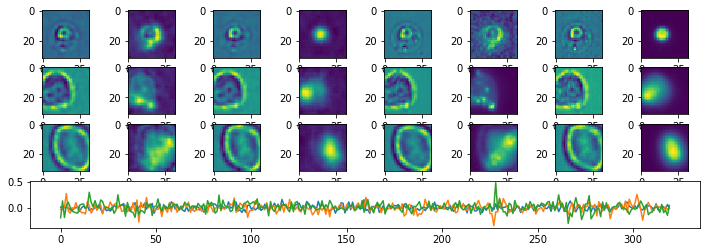

Epoch:  112 Iteration:  0 Loss:  2.31982 0.629385 0.000282913


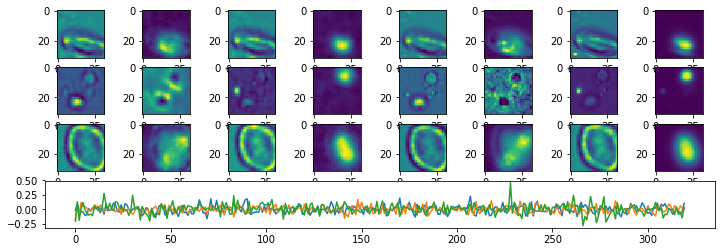

Epoch:  113 Iteration:  0 Loss:  2.29215 0.629373 0.000232995


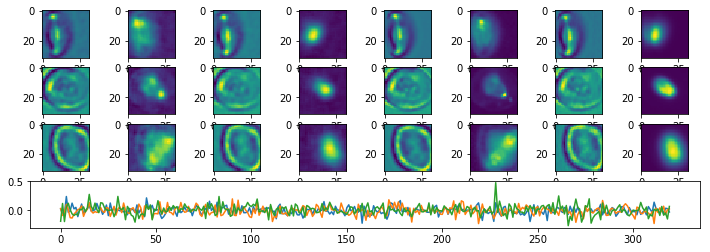

Epoch:  114 Iteration:  0 Loss:  2.28168 0.629365 0.000178188


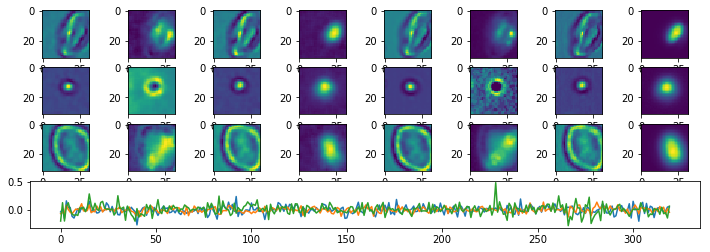

Epoch:  115 Iteration:  0 Loss:  2.29527 0.629376 0.000279039


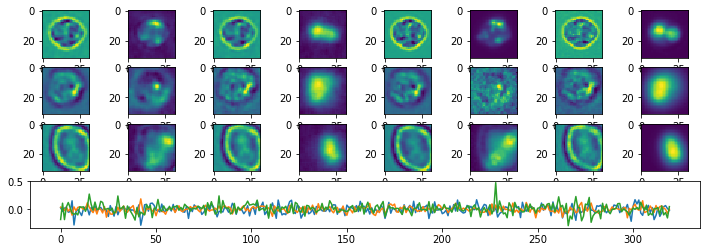

Epoch:  116 Iteration:  0 Loss:  2.26716 0.629357 0.000251323


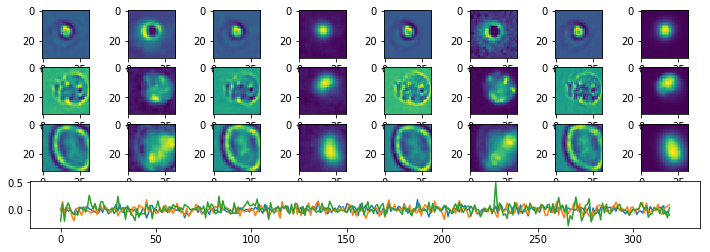

Epoch:  117 Iteration:  0 Loss:  2.27062 0.629361 0.000199229


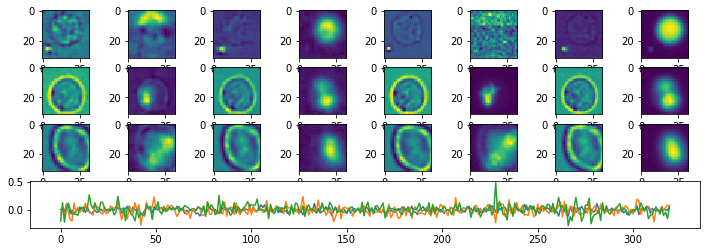

Epoch:  118 Iteration:  0 Loss:  2.26763 0.629359 0.00033769


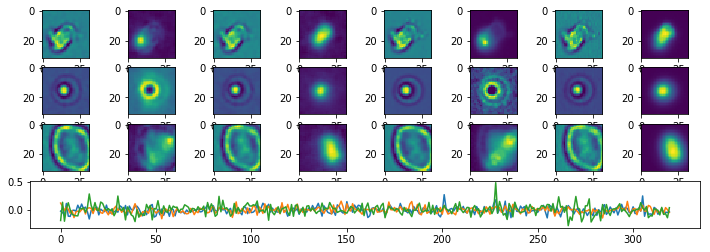

Epoch:  119 Iteration:  0 Loss:  2.25742 0.629354 0.000189096


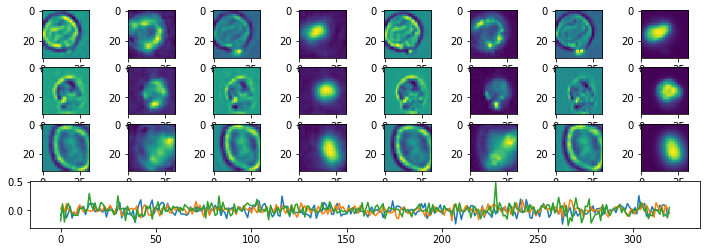

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 320 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-26-LS320"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4